# Exploratory functional analysis notebook: 
<p>The goal of this notebook is produce a functional connectivity matrix between neurons most fit for graph theory analysis.
This would include several decision points and can be confirmed and validated through several means. In essence we want connectivity which makes sense
Given our nodes, one should not expect highly distant correlation matrix. Finally, we'll want to examine functional connectivities across fish and datasets and see how they differ</p>

Here are some suggestions or *decision points* for how to carry this analysis:
* Fine-tune preprocessing step so its tailored to the fish and without artefacts. 
* Reconstruct neuronal traces from only the components which explain the most variance or those without variance
* Attempt different functional connectivity measures: including structural, effective and correlative. These might be able to produce different graphs according to their implementation.
* Threshold correlation matrices
* Regress out 'unimportant' neural variation such as motor activity / global activity

Note: Not all distances fit, for example euclidian distance is difficult to normalize to a value where correlations already exist 

Here are some suggestions for how to validate what we do:
* Examine correlations as a function of distance: If everything is correct then in essence most correlations should decrease as we go away with distance
* Examine functional connectivity with known structural connectivity. For example nodes from motor areas hindbrain can expect some anti-correlation during periods 
* Predict behavioural state from functional connectivity
* Cluster activity to see the validity of functional connectivity towards given correlations and modularity
* Examine functional differences, For example: we can build a motor regressor for left and right and see the differences for how good the data is. Caudal hindbrain are highly correlated  

Current problems:
* Almost no-anti correlations or negative correlation values in some fish
* Correlations are high across distant nodes which isn't replicated from the paper

In [33]:
# Import widget for interactive notebook

# import functional_analysis as fa
import numpy as np
from  matplotlib import pyplot as plt
import h5py
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from pathlib import Path
import json
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.decomposition import TruncatedSVD
from scipy.spatial import distance_matrix
import pandas as pd
from nilearn.connectome import ConnectivityMeasure

# Import from parent folder
import os
import sys
import inspect


sys.path.append(os.path.join(os.path.dirname(sys.path[0]),'code'))
# os.chdir('../Graph-analysis-michael')
# sys.path.append('..')
# sys.path.append('./code')
# sys.path.append('')
import mypatterns as mpt

# TODO: Organize the import functions amidst the files
import mutils as mu
import graph_analysis as ga
import functional_analysis as fa
import behaviour_analysis as ba

In [62]:
import importlib
imported_module = importlib.import_module("mutils")
importlib.reload(imported_module)
imported_module = importlib.import_module("graph_analysis")
importlib.reload(imported_module)
imported_module = importlib.import_module("functional_analysis")
importlib.reload(imported_module)
imported_module = importlib.import_module("behaviour_analysis")
importlib.reload(imported_module)

<module 'behaviour_analysis' from 'c:\\Users\\micha\\Documents\\Projects\\Python projects\\Organizational Principles in Zebrafish\\Code\\Graph-analysis-michael\\code\\behaviour_analysis.py'>

In [3]:
# Load fish data 
fish_id = "220221_f2"
paths = [r'\\FUNES\Shared\experiments\E0040_motions_cardinal\v21\ls\h2b_wb', r'Z:\Shared\experiments\E0040_motions_cardinal\v21\ls\h2b_wb']
if os.path.isdir(Path(paths[0])):
    master_path = Path(paths[0])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)
else:
    master_path = Path(paths[1])
    trace_all, ROIs_all, zf, protocol_params, z_res = mu.read_data(fish_id, master_path)

Keys: <KeysViewHDF5 ['anatomy_stack', 'areas', 'coords', 'rois_stack', 'suite2p_idxs', 'traces']>


In [4]:
# Set up saving path:
# Path("../figures").mkdir(parents=True, exist_ok=True)
fig_save_path = "../figures/" + fish_id
Path(fig_save_path).mkdir(parents=True, exist_ok=True)


#### Perform preprocessing: 
This section will include: 
- Play with different parameter of processing until data looks fine
- Examine statistics of preprocessed data

In [5]:
# Perform preprocessing of traces
nantest = np.sum(trace_all,axis = -1)
TC = np.squeeze(trace_all[np.argwhere(~np.isnan(nantest)),:])
fc_baseline=1/300  # Hz, 5 min period
TC=mpt.clean(TC, sampling_frq = zf, highpass = fc_baseline)

### Examine neuronal traces according to original, preprocessing and reconstruction:
The goal: Get an intuition about the dataset and noises and also prepare differently processed neuronal sets for graph analysis.
This will include 
- Raw traces
- Preprocessed traces for highpass and zscore
- Preprocessed traces that were reconstructed using SVD / PCA / Other dimentionality techniques through the main principal components

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

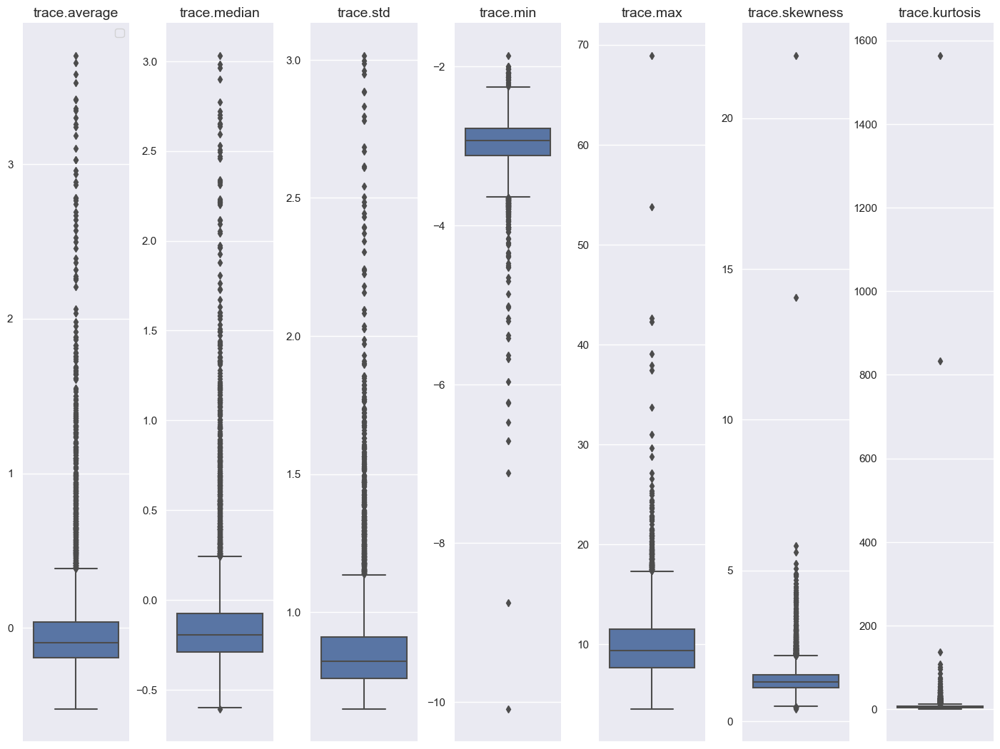

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

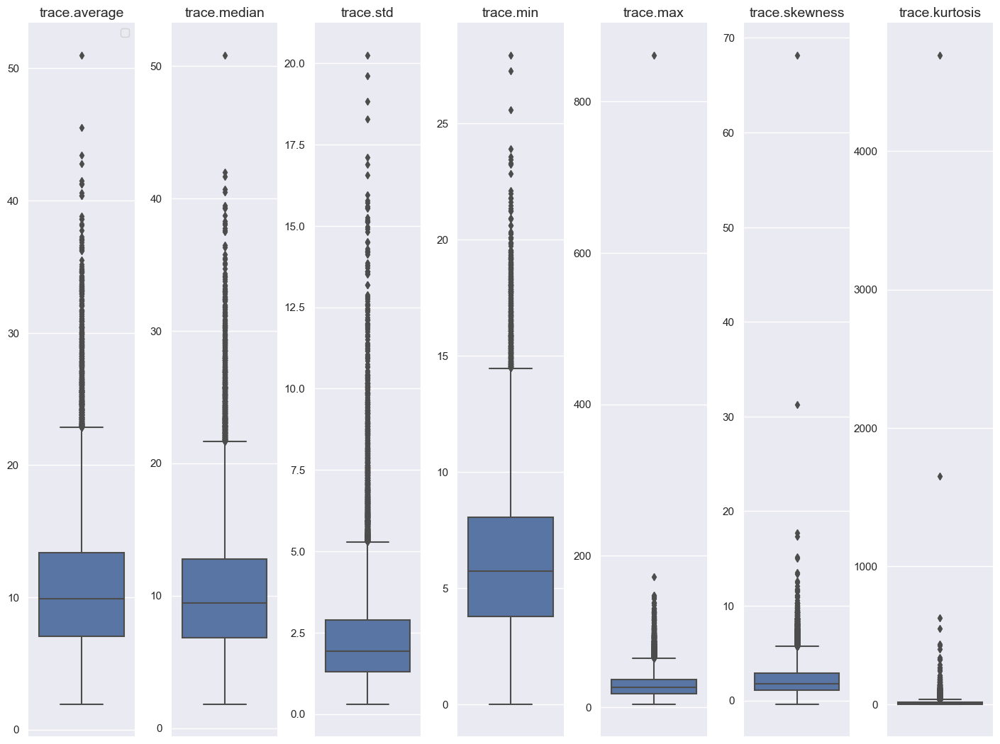

In [9]:
# Examine the statistics of preprocessed data
sns.set_theme()
df_trace_features = mu.extract_features(TC)
headers = df_trace_features .columns.values.tolist()[1:]
f = mu.plot_boxplot_features(df_trace_features, headers)


df_trace_org_features = mu.extract_features(trace_all)
headers_org = df_trace_org_features.columns.values.tolist()[1:]
f_org = mu.plot_boxplot_features(df_trace_org_features, headers_org)

# Save the distribution after preprocessing: 
f.savefig(fig_save_path + '/preprocessed_traces statistics plot.png')
f_org.savefig(fig_save_path + '/original traces statistics plot.png')
sns.set_theme(style="white", palette=None) # Return the theme to original


# TODO: Examine statistics of other forms of data

# TODO: Examine corresponding histograms of values

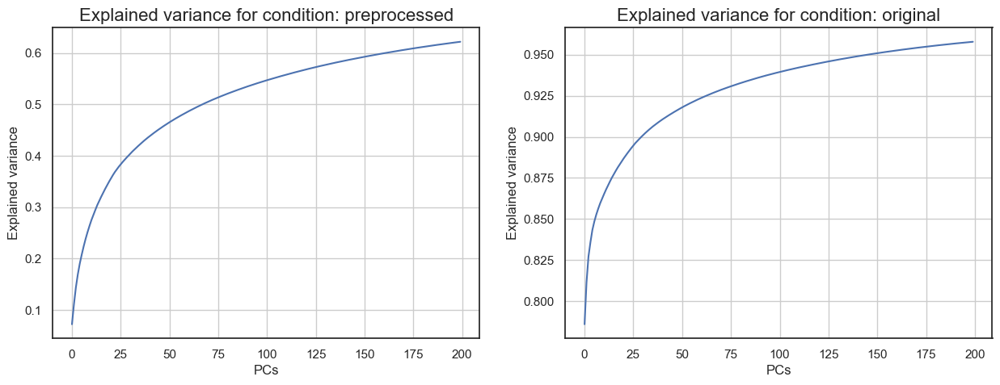

In [ ]:

# TODO: Functionalize this furhter
def recon_traces_custom(traces, n_start: int = 1, n_end: int = 2) -> np.ndarray:
    """
    Reconstruct traces from selected componenets
    Input:
    - Traces: Neuronal traces provided  neurons x time matrix form
    - n_start: The starting most explained component
    - n_end: The last most explained component
    Returns
    - custom_recon_traces: The reconstructed traces from selected components

    """
    U,s,V = np.linalg.svd(traces)
    # recon_img = U @ s[1:10] @ V
    S = np.zeros(np.shape(traces))
    for i in range(n_start, n_end):
        S[i,i] = s[i]
    custom_recon_traces = U @ S @ V
    return custom_recon_traces

# Reduce and Reconstruct for preprocssed traces
n_com = 200
svd_pp = TruncatedSVD(n_components=n_com)
reduced_traces = svd_pp.fit_transform(TC.T)
reconstructed_traces = svd_pp.inverse_transform(reduced_traces)

# Reduce and Reconstruct for preprocssed traces
svd_org = TruncatedSVD(n_components=n_com)
reduced_traces_org = svd_org.fit_transform(trace_all)
reconstructed_traces_org = svd_org.inverse_transform(reduced_traces_org)

# Reconstruct from custom selected 
custom_recon_traces = recon_traces_custom(TC.T,1, 3)

# Examine the different axis
f_explained, var_axes = plt.subplots(1,2,figsize=(15,5))
mu.examine_explained_variance(svd_pp, n_com, var_ax=var_axes[0], title='preprocessed')
mu.examine_explained_variance(svd_org, n_com, var_ax=var_axes[1], title='original')

f_explained.savefig(fig_save_path + '/explained variance by models plot.png')




In [ ]:
# TODO: Perform the same reconstruction for PCA:

In [ ]:
# TODO: Perform the same reconstruction for DMD:

In [ ]:
# TODO: Perform reconstruction for t-SNE

Traces will be spread 11 units apart
Traces will be spread 47 units apart
Traces will be spread 9 units apart
Traces will be spread 2 units apart


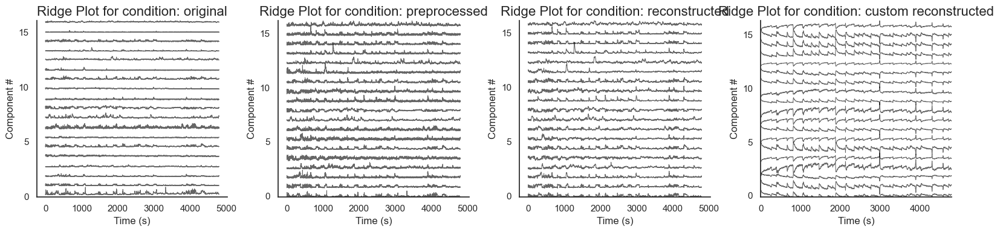

In [ ]:
# TODO Add random sub-sampling from population of traces
# Plot the traces to examine the quality of the reconstruction
n_neurons = 20
f_traces, traces_axes = plt.subplots(1,4,figsize=(16,4))
mu.plot_neuronal_ridgeplot(TC.T, n_neurons , 1, title="preprocessed", traces_ax=traces_axes[1])
mu.plot_neuronal_ridgeplot(trace_all, n_neurons , 1, title="original", traces_ax=traces_axes[0])
mu.plot_neuronal_ridgeplot(reconstructed_traces, n_neurons , 1, title="reconstructed", traces_ax=traces_axes[2])
mu.plot_neuronal_ridgeplot(custom_recon_traces, n_neurons , 1, title="custom reconstructed", traces_ax=traces_axes[3])

plt.tight_layout()
f_traces.savefig(fig_save_path + '/ridge plot traces.png')
# TODO: Add examination of behaviour data with 

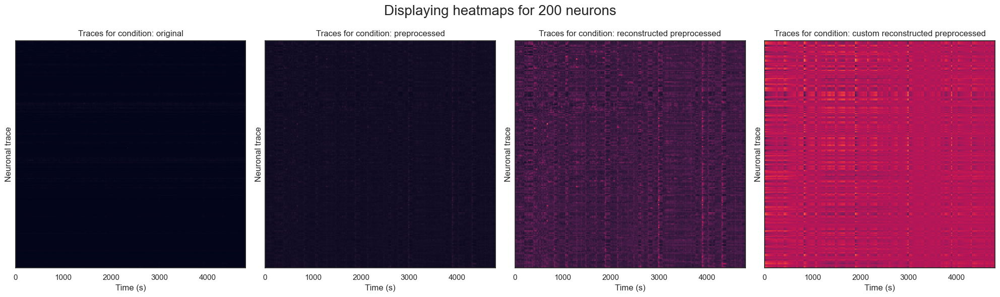

In [ ]:
# TODO: Implement random subsampling here
# Examine traces after different preprocessing steps
fig_heatmap, axes = plt.subplots(1, 4, figsize=(20, 6))
display_n_traces = 200
fig_heatmap.suptitle('Displaying heatmaps for {} neurons'.format(display_n_traces),size=20)
mu.plot_heatmap(trace_all[:display_n_traces ,:], axes[0], plot_title='original')
mu.plot_heatmap(TC.T[:display_n_traces ,:], axes[1], plot_title='preprocessed')
mu.plot_heatmap(reconstructed_traces[:display_n_traces ,:], axes[2], plot_title='reconstructed preprocessed') # Reconstructed from preprocessing dataset
mu.plot_heatmap(custom_recon_traces[:display_n_traces ,:], axes[3], plot_title='custom reconstructed preprocessed') # Reconstructed from preprocessing dataset
plt.tight_layout()
fig_heatmap.savefig(fig_save_path + '/traces heatmap for {} neurons plot.png'.format(display_n_traces))

#### **Decision point** - Select the traces to use for connectivity:
Select which dataset to work on and under which conditions:
* Raw dataset
* Preprocessed dataset condition
* Reconstructed dataset (Which dimentionality reduction to reconstruct with which principal components)

In [ ]:
# TODO: Implement a decision point about which type of data to choose

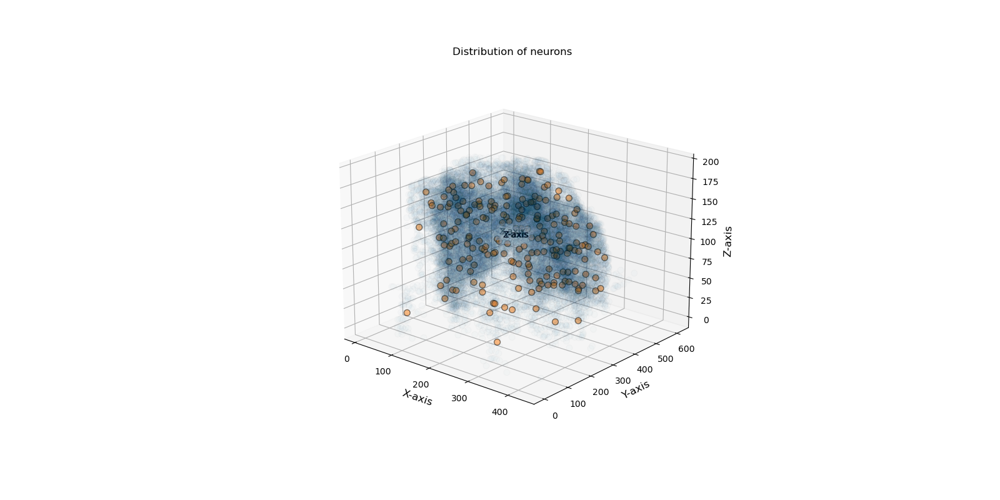

In [6]:
# Make Interactive
%matplotlib widget
# TODO: This can be only run once, fix it or take note that the notebook can't run this cell twice
# Spatially parcellate our traces
XYZ, LR_centers, indices = ga.parcellate_zebrafish_brain(ROIs_all, z_res, nantest)

# Sanity check that parcellation is infact correct
fig, axs = plt.subplots(1, 1, figsize=(16, 8), subplot_kw=dict(projection='3d'))
ga.plot_3d_projection(XYZ, ax=axs,dot_size=50,transparency=0.015)
ga.plot_3d_projection(LR_centers, ax=axs,dot_size=50)
fig.savefig(fig_save_path + '/3D anatomy of centroid centers plot.png')

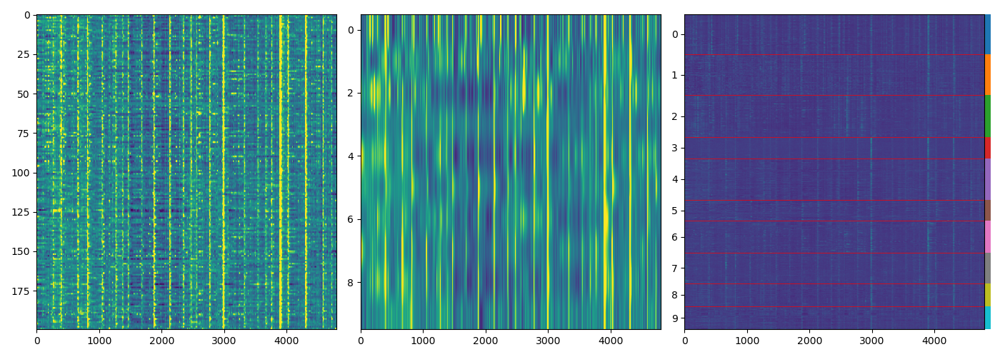

In [7]:
# Decision point: representative node activity
# TODO: 
# - Add a function that displays for the corresponding neuroal traces for functional clusters 
# - Add mean matrix transformation onto a function
# Sum the mean data and cluster them spatially
N=LR_centers.shape[0] # The number of clusters which is 2 * cluster per hemisphere
T = TC.shape[0]
M_all = np.empty((T,N))

for c in range(N):
    sub_ind = np.squeeze(np.argwhere(indices==c)[:,0])
    if np.size(sub_ind) > 1:
        M_all[:,c] =  np.nanmean(TC[:,sub_ind],axis=1)
    elif np.size(sub_ind) == 1:
         M_all[:,c] =  TC[:,sub_ind]

# Extract relevant parameters
selected_clust = np.arange(0,10) # Select the first 5 clusters
select_neurons_ind = np.squeeze(np.argwhere(indices==selected_clust)[:,0]) # Select correspond neurons
select_neurons = TC[:,select_neurons_ind].T
clus_id_arr = np.extract(np.squeeze(np.isin(indices, selected_clust)), indices)

# Plot mean node response along side the clustered neurons
fig_clus, axs = plt.subplots(1, 3, figsize=(14, 5))
axs[0].imshow(M_all.T, aspect='auto',vmin = -1, vmax = 1)
axs[1].imshow(M_all.T[selected_clust], aspect='auto',vmin = -1, vmax = 1)
mu.plot_cluster_heatmap(select_neurons, clus_id_arr, axs[2], dt=1.0, clust_colorbar_width=100) 

plt.tight_layout()
fig_clus.savefig(fig_save_path + '/clusters and corresponding neurons plot.png')

# plt.close('all')
# plt.clf 

#### **Decision point**: Decide which elements to regress out  
Regress out unwanted / uninteresting signals, including
- Global signals
- Motor regressor
Although in essence these might capture information we might need


In [ ]:
# TODO: Regress out certain signals to fine-tune the 


#### **Decision point** - Select which functional connnectivity to use:
Select which dataset to work on and under which conditions:
* Correlation between nodes
* Euclidian Distance (Note: Isn't normalized between 0-1 so shouldn't be added)
* Granger Causality: TODO
* Transfer Entropy TODO

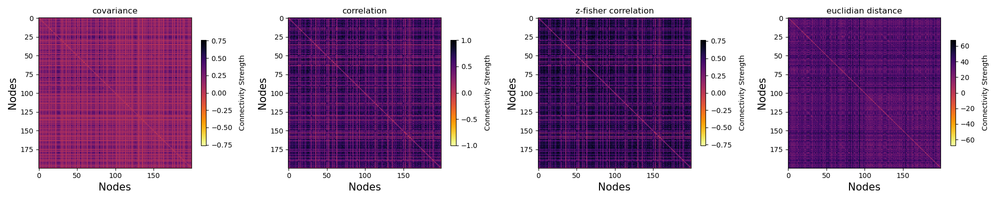

In [9]:
# TODO: 
# Generate various connectivity matrices and plot them
string_connectivity = ['covariance', 'correlation', 'euclidian distance'] 
fc_dict = ga.define_connectivity_matrix(M_all, string_connectivity)


# TODO fix the fact that if length one of array thenthis code falls
fig_con, axs = plt.subplots(1, len(fc_dict), figsize=(len(fc_dict)*5, 4))
for index, (con_name, con_mat) in enumerate(fc_dict.items()):
    ga.plot_correlation_matrix(con_mat,ax=axs[index],title=con_name)
plt.tight_layout()
fig_con.savefig(fig_save_path + '/connectivity metrices plot.png')


c:\Users\micha\Anaconda\envs\course_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


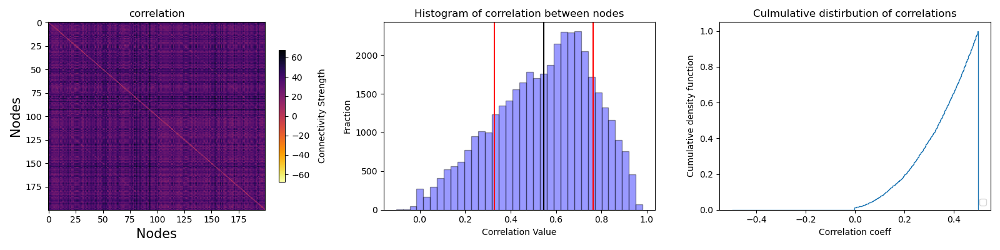

In [10]:
# TODO: Review statistics of correlations
# TODO: Turn this onto a function
# A decision point: Choose your connectivity matrix
selected_connectivity = 'correlation'
correlation_matrix = fc_dict[selected_connectivity ]
correlation_matrix.mean(), correlation_matrix.std(), correlation_matrix.max(), correlation_matrix.min()

# Plotting a select matrix, histogram for correlation distribution and 
fig, axs = plt.subplots(1, 3, figsize=(len(fc_dict)*4, 4))

ga.plot_correlation_matrix(con_mat,ax=axs[0],title=selected_connectivity )

sns.distplot(correlation_matrix, hist=True, kde=False, 
             ax=axs[1], bins=int(180/5), color = 'blue',
             hist_kws={'edgecolor':'black'}, kde_kws={'shade': True,'linewidth': 4})
axs[1].set_title('Histogram of correlation between nodes')
axs[1].set_xlabel('Correlation Value'); axs[1].set_ylabel('Fraction');
axs[1].axvline(correlation_matrix.mean(), color='k')
axs[1].axvline(np.mean(correlation_matrix) + np.std(correlation_matrix), c='r')
axs[1].axvline(np.mean(correlation_matrix) - np.std(correlation_matrix), c='r')


###### plot cdf for Spearman correlation ######
bins = np.linspace(-0.5, 0.5, 500) # set bins in which to compute cdf
# plot cdf for every condition
n, bins, patches = axs[2].hist(np.abs(correlation_matrix).ravel(),
                            bins, density = True,
                            histtype = 'step', 
                            cumulative = True)
# fix axis and labels
axs[2].legend(loc = 4); 
axs[2].set_ylabel('Cumulative density function'); axs[2].set_xlabel('Correlation coeff')
axs[2].set_title('Culmulative distirbution of correlations')
plt.tight_layout()

fig_con.savefig(fig_save_path + '/distribution of {} FC plot.png'.format(selected_connectivity))
# 
# plt.savefig(path_figures + str(kk) + '.png')

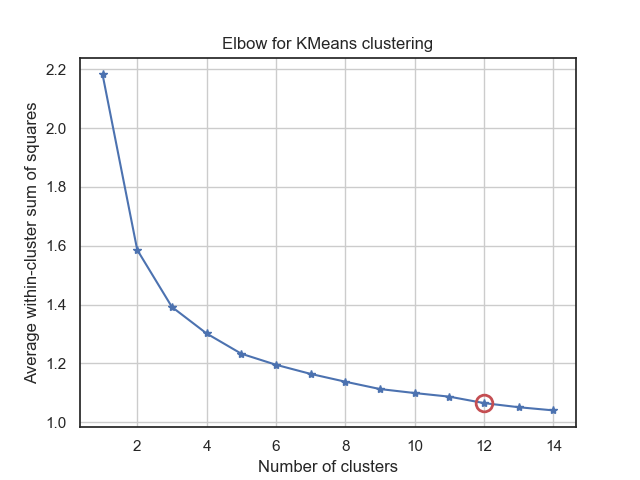

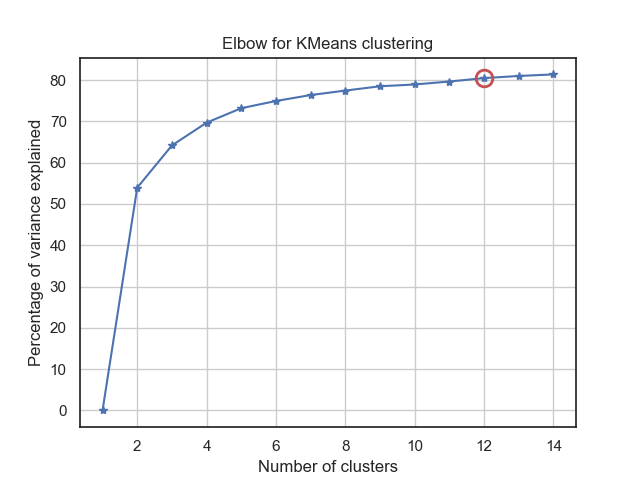

In [ ]:
# Examine cluster amount to cnnfirm modularity and data syncronization
ac = fa.analyze_clustering(correlation_matrix, 15)
ac.plot_elbow(11)

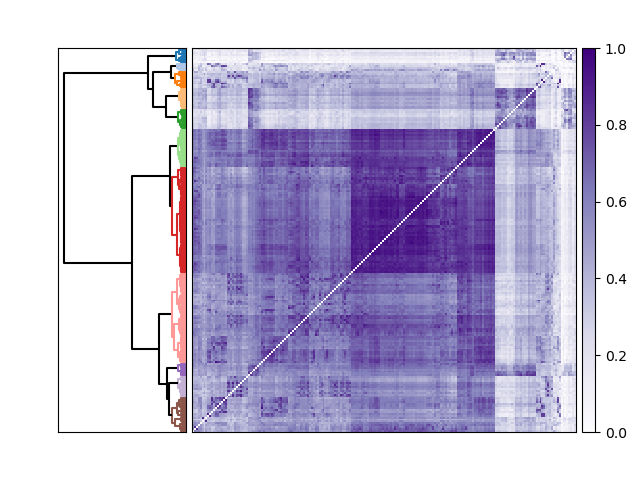

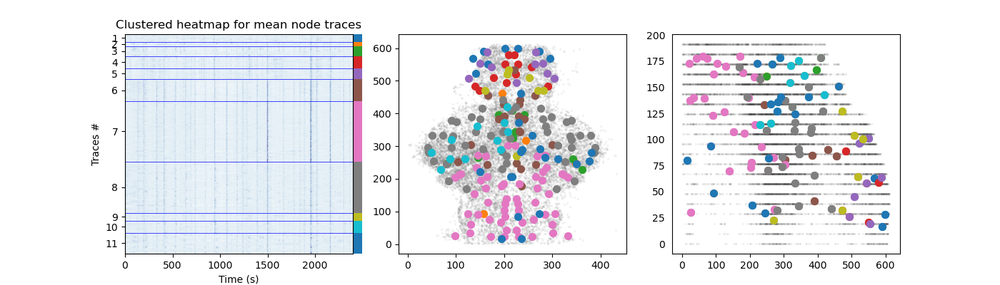

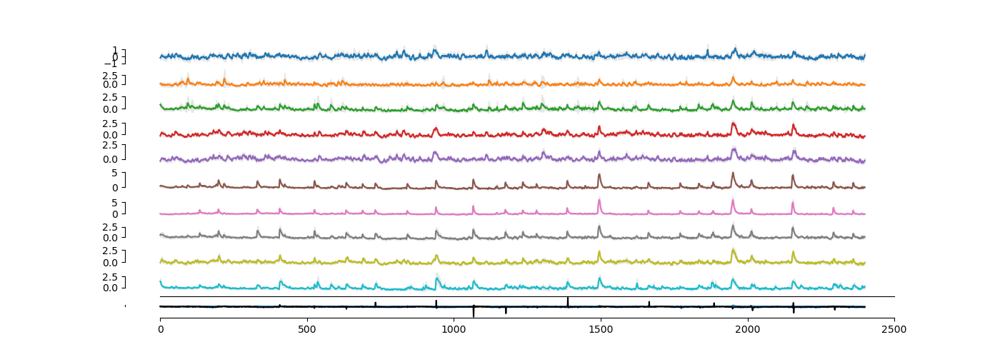

In [63]:
# TODO: Perform clustering on the traces themselves (either through or without reduction)
# TODO: (!) Add Tail trace and color code anatomy % Of responding motor response (Efference copy or direct motor)
# TODO: (!) Add resampling earlier 
n_clusters = 11


FC = fa.functional_clustering(np.nan_to_num(correlation_matrix))

# Supply Correlation matrix
FC.matrix = correlation_matrix

# Hierarchical clustering
FC.linkage()

# Save output cluster ids
FC.predict_cluster(k=n_clusters)

# plot hierarchical clustering matrix
fig_clust_dend = FC.plot_matrix()
fig_clust_dend.savefig(fig_save_path + '/clustered correlation map plot.png')
cluster_labels = FC.clusters

# Plot the ordered clustered map and anatomy
fig_clus_ana, axs = plt.subplots(1, 3, figsize=(14, 4))
mu.plot_cluster_heatmap(M_all.T[:,::int(zf)], cluster_labels, axs[0], dt=1.0, clust_colorbar_width=100, cmap='BuPu', clust_separator_color='blue') 
fa.plot_cluster_anatomy(cluster_labels, LR_centers, XYZ, axs[1:3])
fig_clus_ana.savefig(fig_save_path + '/clustered elements on anatomy and node traces plot.png')


# Plot traces for n clusters
fig_clus_traces, axs_traces = plt.subplots(n_clusters, 1, figsize=(14, 5))
swim_arr = ba.get_tail_sum(master_path / fish_id, goal_sampling_freq = 2400)

fa.plot_cluster_traces(M_all.T[:,::int(zf)], cluster_labels, axs_traces, swim_arr) 
fig_clus_traces.savefig(fig_save_path + '/clustered mean traces and deviation plot.png')


# plt.imshow(M_all.T[np.argsort(labels),:], aspect='auto', cmap='RdBu_r', vmin=-2.5, vmax=2.5)
# clusters_mean = [M_all.T[cluster_labels==i].mean(axis=0) for i in range(n_clusters)] # Extract clusters





# 

In [ ]:
import time
def build_shifted_control(trace_id: int, traces_mat: np.ndarray,
                          num_iters: int = 50, min_shift: int = 300) -> np.ndarray:
    """
    Create a null-distibution of R^2 values based on shifted-control regression-scores:
        1. randomly generate a shift-size in the range of [min_shift, total_time - min_shift)
        2. roll all traces by the shift-size
        3. calculate correlation coefficient (r) for every unit's trace, and store this value
        4. repeat for a total of $num_iters
    
    Returns a matrix containing correlation-coefficient (r) for every shift×neuron pair (output shape: (num_iters, num_units))
    Runtime ~ 240 sec (N=22k, T=1.9k, num_iters=50)
    """
    trace_vec = traces_mat[trace_id,:]
    num_units, num_timestamps = traces_mat.shape
    max_shift = num_timestamps - (min_shift + 1)  # we don't want to shift within less than $min_shift from the end
    rand_shifts = np.random.randint(low=min_shift, high=max_shift, size=num_iters)
    all_shifts_corr_scores = np.zeros((num_iters, num_units))
    for i in range(num_iters):
        shift = rand_shifts[i]
        shifted_traces = np.roll(traces_mat, shift)
        for unit_id, unit_trace in enumerate(shifted_traces):
            r = np.corrcoef(unit_trace, trace_vec)[0, 1]  # calculate the correlation coefficient of each trace w/ the stimulus
            all_shifts_corr_scores[i][unit_id] = r
    return all_shifts_corr_scores

def plot_control_distribution(correlation_data, control_data, unit_id: int, with_unit_id: int, with_plot = False) -> float:
    r = correlation_data[unit_id][with_unit_id]
    control_data = control_data[unit_id,:]
    
    # calculate p-value
    p_value = sum(control_data < r) / len(control_data)
    p_value = 1 - p_value if p_value > 0.5 else p_value
    
    # plot correlation value vs. shuffled control
    if with_plot:
        plt.clf()
        top_percentile = np.percentile(control_data, 97.5)
        low_percentile = np.percentile(control_data, 2.5)
        plt.hist(control_data, bins=10)
        y_min, y_max = plt.gca().get_ylim()
        plt.vlines([top_percentile, low_percentile], y_min, y_max, color='k')
        plt.vlines([r], y_min, y_max, color='gold')
        plt.title(f"Unit {unit_id} againts Unit {with_unit_id}\n\tP$<=${p_value}")
        plt.show()
    
    return p_value




In [ ]:
# Test correlation generation for one neuron:
start_time = time.time()

trace_id = 1
stim_name = str(trace_id)
print(f"Building shifted control for trace #0 ({stim_name}°)")

trace_corr_scores = build_shifted_control(trace_id, TC.T)

elapsed = time.time() - start_time
print(f"elapsed:\t{elapsed:.2f} sec")

trace_corr_scores.shape, trace_corr_scores.min(), trace_corr_scores.max()

NameError: name 'time' is not defined

In [ ]:
r_test = correlation_matrix[0][4]
p_value = sum(trace_corr_scores[0,:] < r_test ) / len(trace_corr_scores[0,:])
p_value

1.0

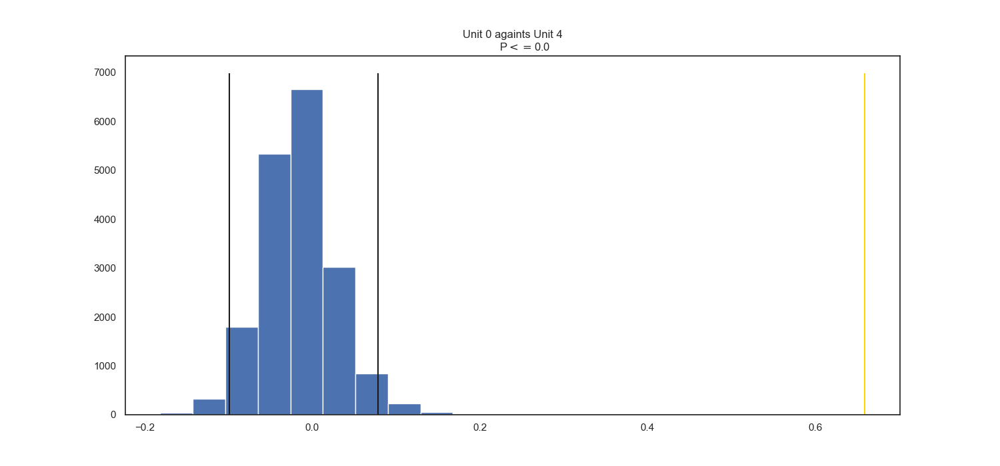

In [ ]:
fig = plt.figure()
p_values = plot_control_distribution(correlation_matrix, trace_corr_scores, 0, 4, with_plot=True)

In [ ]:
# Validate thresholding worked (Test) - take an example test from pyform

#### Summary: Validate the functional connectivity
There are several ways to validate function connectivity

In [27]:
spatial_dist_mat.shape

(200, 200)

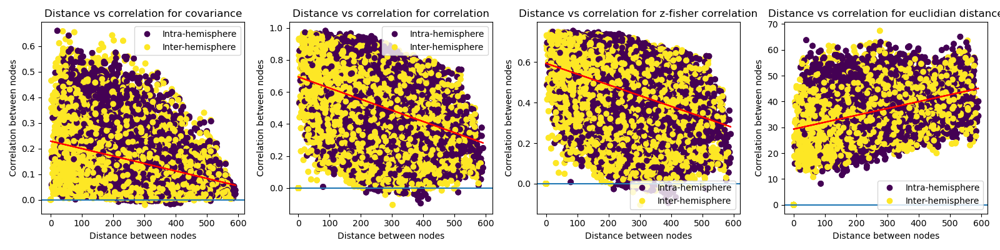

In [32]:
# This is one of the validation tests
# thresh_corr = ga.threshold_conn_by_constant(correlation_matrix,0.8)
# selected_connectivity = 'z-fisher correlation'
# z_correlation_matrix = fc_dict[selected_connectivity ]

# TODO: Turn into a function
# Plot correlation againts distance

# # Generate the plot
fig, axes = plt.subplots(1,len(fc_dict),figsize=(4*len(fc_dict),4))
coord_pos = list(zip(LR_centers[:,0],LR_centers[:,1]))
spatial_dist_mat = distance_matrix(coord_pos,coord_pos)
for index, (con_name, con_mat) in enumerate(fc_dict.items()):
    ga.plot_corr_vs_dist(spatial_dist_mat,  con_mat, ax=axes[index], title=con_name)
plt.tight_layout()

# # TODO: Under how they implemented Fisher-Z (But why did they do it?)
# fz_Corr = np.arctanh(correlation_matrix)
fig.savefig(fig_save_path + '/Distance vs correlations plots.png')


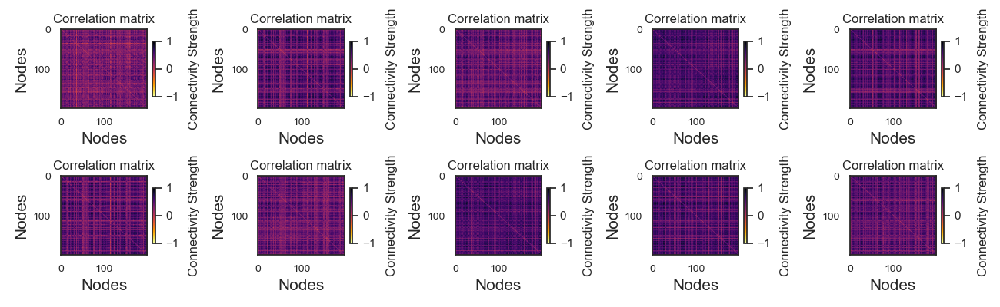

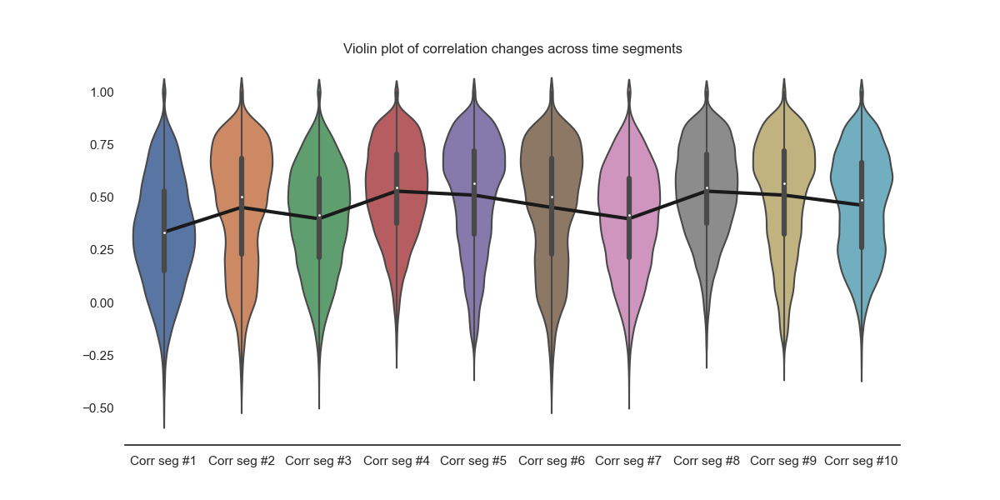

In [ ]:
# TODO: Examine functional connectivity overtime
# Build the chunks
def build_chunks(arr, chunk_size, axis=1):
    return np.split(arr, range(chunk_size, arr.shape[axis], chunk_size), axis=axis) 
segmented_tc = build_chunks(TC, 480, axis=0) # Segment into 10 Chunks each of 240 secs, why just 10 chunks?

# Create new pandas dataframe
pd_nodes = pd.DataFrame()

# 
count = len(segmented_tc)
N=200
counter = 1
n_col = 2
n_rows = 5
correlation_measure = ConnectivityMeasure(kind='correlation')
fig, axs = plt.subplots(n_col , n_rows, figsize=(13, 4))
for i in range(n_col):
    for j in range(n_rows):
        current_TC = segmented_tc[i+j]
        T = current_TC.shape[0]
        M_all_seg = np.empty((T,N))
        for c in range(N):
            sub_ind = np.squeeze(np.argwhere(indices==c)[:,0])
            if np.size(sub_ind) > 1:
                M_all_seg[:,c] =  np.nanmean(current_TC[:,sub_ind],axis=1)
            elif np.size(sub_ind) == 1:
                M_all_seg[:,c] =  current_TC[:,sub_ind]
        correlation_matrix_seg = correlation_measure.fit_transform([M_all_seg])[0]
        pd_nodes["Corr seg #{}".format(counter)] = correlation_matrix_seg.ravel()
        ga.plot_correlation_matrix(correlation_matrix_seg,ax=axs[i][j])
        counter+=1

fig.savefig(fig_save_path + '/FC Matrices across time segments.png')

plt.tight_layout()
# Create violin plots 
# feature = 'n_peaks' # number of peaks per min
# conditions = ["awake","iso","rec30","rec60","rec120","rec180","rec240","rec300","rec360"]

f, axes = plt.subplots(1, 1, figsize=(12, 6), sharex=True)
sns.despine(left=True)
# axes.set_ylim([0, 100.0])
# sns.violinplot(x='condition', data=df_estimators,ax=axes,order = conditions,scale='width',cut=0)
sns.pointplot(data=pd_nodes, markers='o', scale=1.1, color='k', ax=axes)
sns.violinplot(data=pd_nodes,ax=axes,scale='width')
plt.title('Violin plot of correlation changes across time segments')
f.savefig(fig_save_path + '/Violin of FC across time seg.png')

# sns.pointplot(x='condition', y=feature, markers='o', scale=1.1, color='k',data=df_estimators.groupby('condition', as_index=False)[feature].median(), ax=axes,order=conditions)
# plt.savefig("n_peaks.png")
# plt.savefig("n_peaks.eps")
    

interactive(children=(FloatSlider(value=0.8, description='corr_coef', max=1.0), Output()), _dom_classes=('widg…

interactive(children=(FloatSlider(value=80.0, description='percentile'), Output()), _dom_classes=('widget-inte…

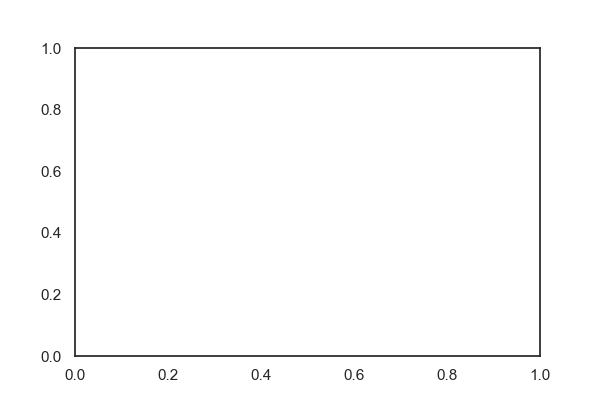

In [ ]:
from ipywidgets import interact
import ipywidgets as widgets
%matplotlib inline
%matplotlib widget

# TODO: Implement different rhesholding methods threshold 


def refresh_constant(corr_coef=.8):
  fig, axs = plt.subplots(1,1,figsize=(6, 4))
  const_thresh_corr_mat = ga.threshold_conn_by_constant(correlation_matrix,corr_coef)
  ga.plot_correlation_matrix(const_thresh_corr_mat,ax=axs,title='Constant')
  plt.show()

_ = widgets.interact(refresh_constant, corr_coef=(0,1, .1))

# with output:

from ipywidgets import interact
import ipywidgets as widgets
%matplotlib inline
%matplotlib widget

fig, ax = plt.subplots(figsize=(6, 4))

def refresh_per(percentile=80):
  fig, axs = plt.subplots(1, 1, figsize=(6, 6))
  per_thresh_corr_mat = ga.threshold_conn_by_percentile(correlation_matrix, percentile)
  ga.plot_correlation_matrix(per_thresh_corr_mat,ax=axs,title='Percentile')
  plt.show()

_ = widgets.interact(refresh_per, percentile=(0, 100, .1))

# A decision point: Thresholding method
# Plot different thresholding

In [ ]:
# TODO: Implement Embedding for clustering visualizations:
# TODO: Implement TSNE Embedding:
# TODO: mean trace


fc = fc_pearson.copy()
# Select embedding method for dimentional data: 
# fc_embedded = TSNE(n_components=2, perplexity=5, learning_rate=100, n_iter=5000).fit_transform(fc_diag)
fc_embedded = PCA(n_components=2).fit_transform(fc_diag)
# Plot the results
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
colors = ['g' if i==0 else 'r' for i in df['sex'].values]
ax[0].set_title('target')
colors = ['g' if i==0 else 'r' for i in df['target'].values]
ax[0].scatter(fc_embedded[:, 0], fc_embedded[:, 1], alpha=0.2, c=colors)
ax[1].set_title('sex')
colors = ['g' if i==0 else 'r' for i in df['sex'].values]
ax[1].scatter(fc_embedded[:, 0], fc_embedded[:, 1], alpha=0.2, c=colors)
plt.show()